In [1]:
import pandas as pd

# Load the datasets
study_dataset = pd.read_excel('merged_final_with_updated_features.xlsx')
future_dataset = pd.read_excel('future_dataset_merged.xlsx')

# Final averaged theta
theta = 0.067786

# Filter the study dataset to get only 2023 values
data_2023 = study_dataset[study_dataset['Year'] == 2023]

# Calculate the baseline for 2023
data_2023['baseline_outcome'] = data_2023['crime_reach'] - theta * data_2023['transit_reach']

# Map the baseline outcomes to the future dataset
baseline_outcomes = data_2023.set_index('id')['baseline_outcome'].to_dict()
future_dataset['baseline_outcome'] = future_dataset['id'].map(baseline_outcomes)

# Predict the outcomes for 2024 in the future dataset
future_dataset['crime_reach'] = future_dataset['baseline_outcome'] + theta * future_dataset['transit_reach']

# Calculate the crime reach difference
future_dataset = future_dataset.merge(data_2023[['id', 'crime_reach']], on='id', suffixes=('', '_2023'))
future_dataset['crime_reach_difference'] = future_dataset['crime_reach'] - future_dataset['crime_reach_2023']

# Display the updated future dataset
print(future_dataset[['id', 'transit_reach', 'baseline_outcome', 'crime_reach', 'crime_reach_2023', 'crime_reach_difference']])


        id  transit_reach  baseline_outcome   crime_reach  crime_reach_2023  \
0        1       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
1        4       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
2        5       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
3        6       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
4        7       0.000000      3.082790e-13  3.082790e-13      3.082790e-13   
...    ...            ...               ...           ...               ...   
6174  6564       0.028420      2.903927e-03  4.830376e-03      4.830376e-03   
6175  6565       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
6176  6566       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
6177  6567       0.000000      0.000000e+00  0.000000e+00      0.000000e+00   
6178  6568       0.011518     -6.656727e-04  1.150579e-04      1.150579e-04   

      crime_reach_difference  
0               0.00

C:\Users\azizs\AppData\Local\Temp\ipykernel_44220\2298104648.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_2023['baseline_outcome'] = data_2023['crime_reach'] - theta * data_2023['transit_reach']


In [2]:
future_dataset.to_excel("final_final_future_dataset.xlsx", index=False)

In [3]:
future_dataset.head()

,id,type,Year,street_count,longitude,latitude,elevation,average_segments_length,betweenness_centrality,scaled_betweenness_centrality,...,census_population,english_as_mother_tongue,unemployment_rate,public_transport,median_household_income,population_in_low_income_households,baseline_outcome,crime_reach,crime_reach_2023,crime_reach_difference
0,1,Junction,2024,2,-123.224758,49.274760,65,396.227813,0.000000e+00,0.000000,...,13117.5,58.0,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0
1,4,Junction,2024,4,-123.220892,49.271168,90,480.393636,2.100000e-07,0.020964,...,13117.5,58.0,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0
2,5,Junction,2024,3,-123.220567,49.273832,71,522.393980,3.214230e-04,32.142337,...,13117.5,58.0,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0
3,6,Junction,2024,3,-123.219613,49.268957,93,265.464150,3.203230e-04,32.032279,...,13117.5,58.0,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0
4,7,Junction,2024,2,-123.219572,49.267203,97,261.840633,4.610000e-06,0.461198,...,13117.5,58.0,7.31,33.69,80873.5,20.29,3.082790e-13,3.082790e-13,3.082790e-13,0.0


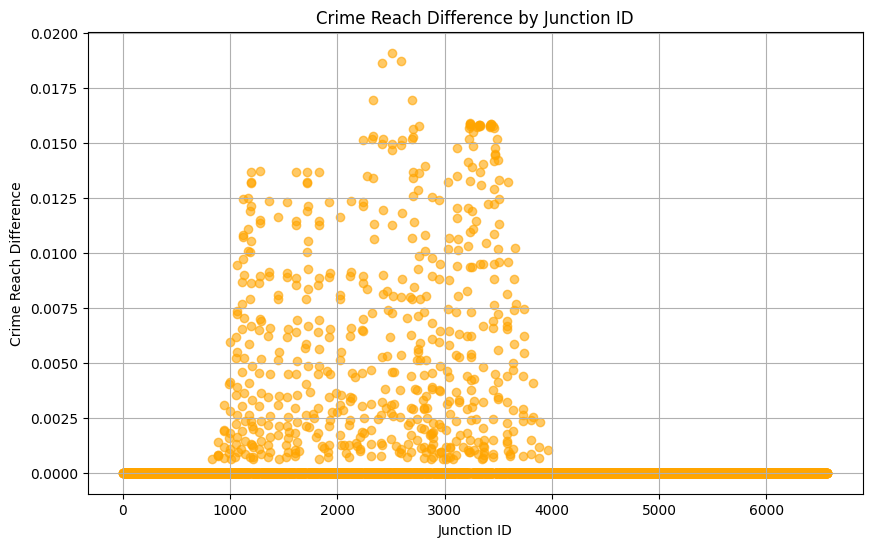

In [4]:
import matplotlib.pyplot as plt

# Plot the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(future_dataset['id'], future_dataset['crime_reach_difference'], color='orange', alpha=0.6)
plt.xlabel('Junction ID')
plt.ylabel('Crime Reach Difference')
plt.title('Crime Reach Difference by Junction ID')
plt.grid(True)
plt.show()



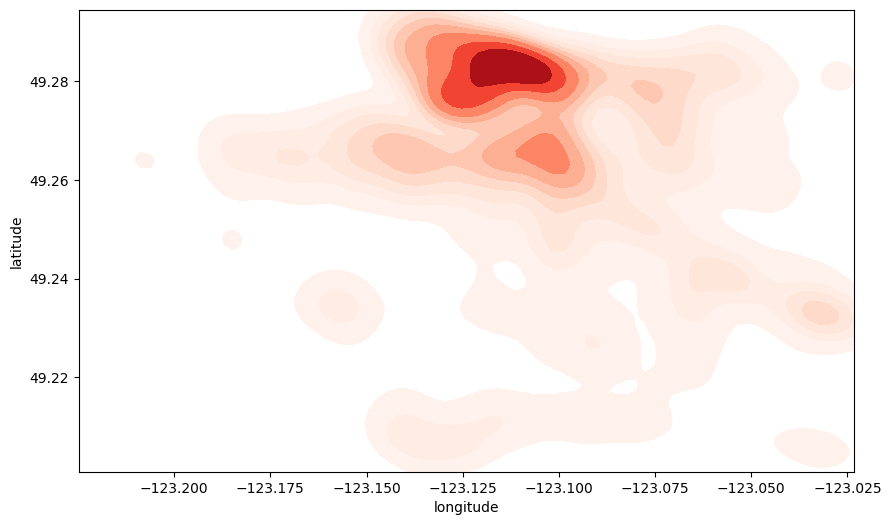

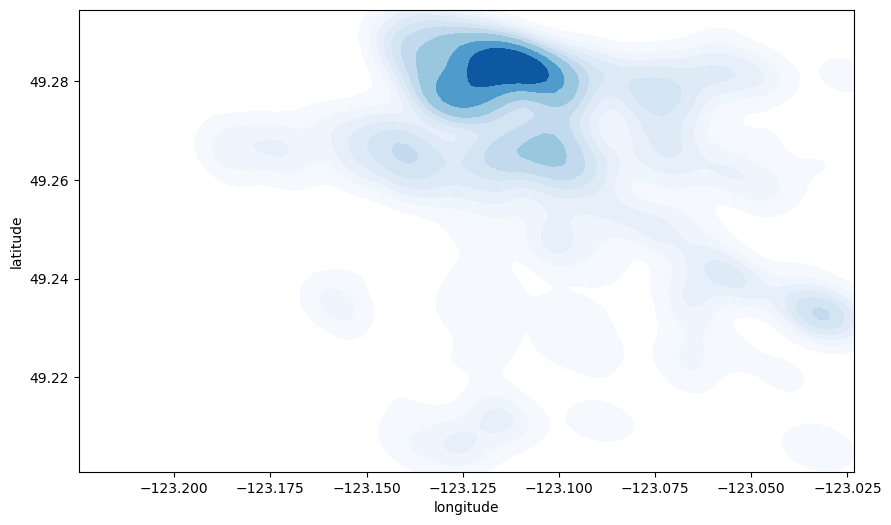

In [5]:
import pandas as pd
import folium
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# Create a GeoDataFrame for 2024 crime reach
geometry = [Point(xy) for xy in zip(future_dataset['longitude'], future_dataset['latitude'])]
geo_df = gpd.GeoDataFrame(future_dataset, geometry=geometry)

# Define the boundaries of the map
minx, miny, maxx, maxy = geo_df.total_bounds

# Create a Folium map
m = folium.Map(location=[geo_df['latitude'].mean(), geo_df['longitude'].mean()], zoom_start=12)

# Generate KDE plot for crime reach 2024
plt.figure(figsize=(10, 6))
sns.kdeplot(
    x=geo_df['longitude'], y=geo_df['latitude'], weights=geo_df['crime_reach'],
    cmap="Blues", fill=True, bw_adjust=0.5, gridsize=100
)

# Save the KDE plot
plt.axis([minx, maxx, miny, maxy])

# Overlay the KDE plot on the Folium map
folium.raster_layers.ImageOverlay(
    name='KDE',
    image='kde_crime_reach_2024.png',
    bounds=[[miny, minx], [maxy, maxx]],
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    zindex=1,
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)
m


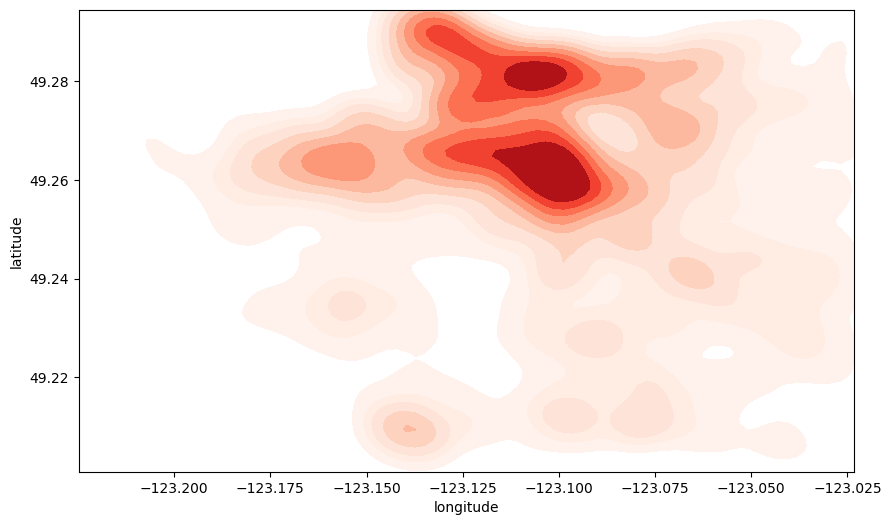

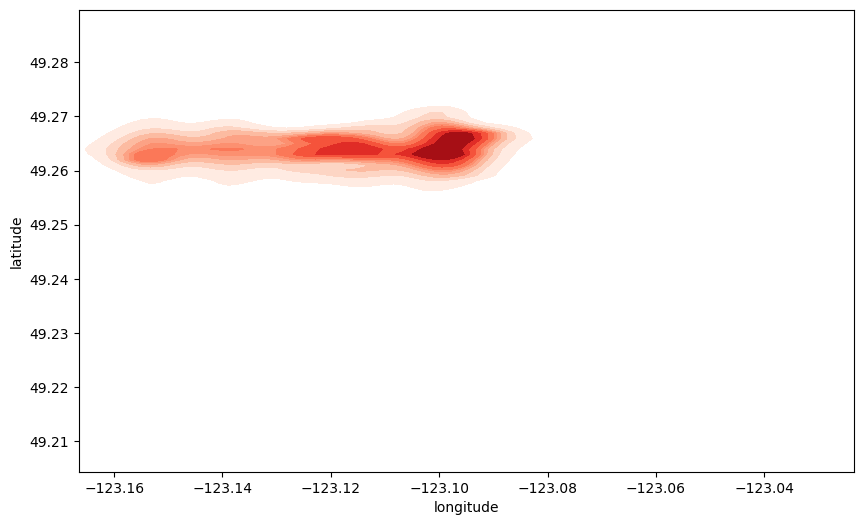

In [6]:
# Filter out rows with non-positive crime reach difference values if needed
positive_future_data = future_dataset[future_dataset['crime_reach_difference'] > 0]

# Create a GeoDataFrame for crime reach difference
geometry = [Point(xy) for xy in zip(positive_future_data['longitude'], positive_future_data['latitude'])]
geo_df_diff = gpd.GeoDataFrame(positive_future_data, geometry=geometry)

# Define the boundaries of the map
minx_diff, miny_diff, maxx_diff, maxy_diff = geo_df_diff.total_bounds

# Create a Folium map for crime reach difference
m_diff = folium.Map(location=[geo_df_diff['latitude'].mean(), geo_df_diff['longitude'].mean()], zoom_start=12)

# Generate KDE plot for crime reach difference
plt.figure(figsize=(10, 6))
sns.kdeplot(
    x=geo_df_diff['longitude'], y=geo_df_diff['latitude'], weights=geo_df_diff['crime_reach_difference'],
    cmap="Reds", fill=True, bw_adjust=0.5, gridsize=100
)

# Save the KDE plot
plt.axis([minx_diff, maxx_diff, miny_diff, maxy_diff])

# Overlay the KDE plot on the Folium map
folium.raster_layers.ImageOverlay(
    name='KDE',
    image='kde_crime_reach_difference.png',
    bounds=[[miny_diff, minx_diff], [maxy_diff, maxx_diff]],
    opacity=0.8,
    interactive=True,
    cross_origin=False,
    zindex=1,
).add_to(m_diff)

# Add layer control
folium.LayerControl().add_to(m_diff)

# Save and display the map
m_diff


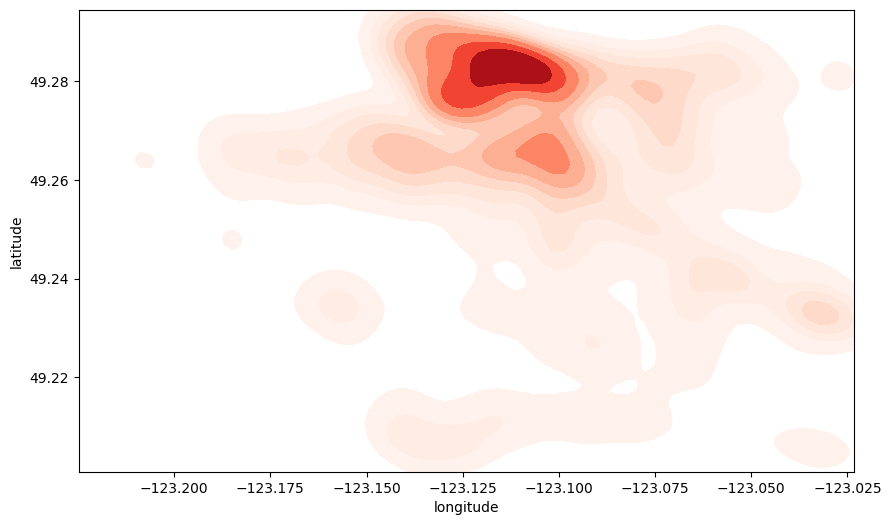

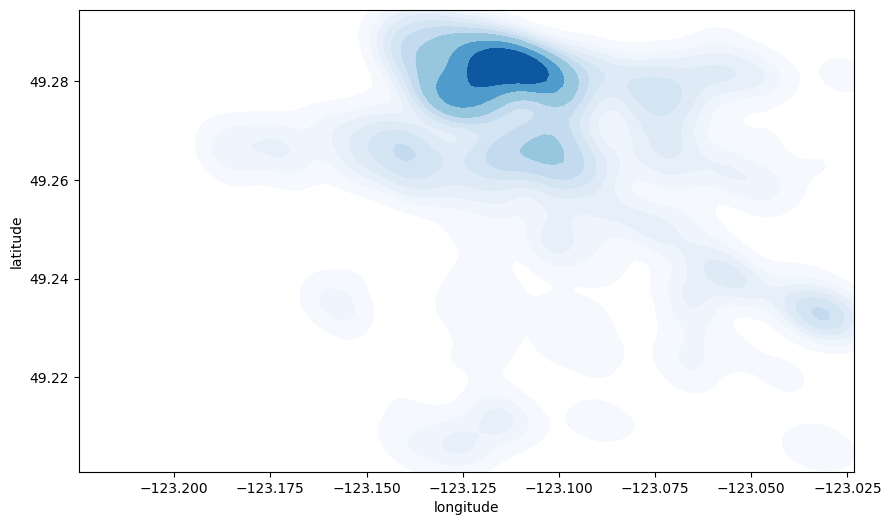

In [16]:
import pandas as pd
import folium
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# Create a GeoDataFrame for 2024 crime reach
geometry = [Point(xy) for xy in zip(future_dataset['longitude'], future_dataset['latitude'])]
geo_df = gpd.GeoDataFrame(future_dataset, geometry=geometry)

# Define the boundaries of the map
minx, miny, maxx, maxy = geo_df.total_bounds

# Create a Folium map
m = folium.Map(location=[geo_df['latitude'].mean(), geo_df['longitude'].mean()], zoom_start=12)

# Generate KDE plot for crime reach 2024
plt.figure(figsize=(10, 6))
sns.kdeplot(
    x=geo_df['longitude'], y=geo_df['latitude'], weights=geo_df['crime_reach'],
    cmap="Blues", fill=True, bw_adjust=0.5, gridsize=100
)

# Save the KDE plot
plt.axis([minx, maxx, miny, maxy])

# Overlay the KDE plot on the Folium map
folium.raster_layers.ImageOverlay(
    name='KDE',
    image='kde_crime_reach_2024.png',
    bounds=[[miny, minx], [maxy, maxx]],
    opacity=0.8,
    interactive=True,
    cross_origin=False,
    zindex=1,
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)
m

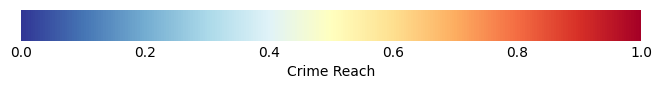

In [32]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from shapely.geometry import Point
import geopandas as gpd
from matplotlib import cm
from branca.element import Template, MacroElement

# Normalize the crime_reach for color mapping
min_crime_reach = future_dataset['crime_reach'].min()
max_crime_reach = future_dataset['crime_reach'].max()
future_dataset['normalized_crime_reach'] = (future_dataset['crime_reach'] - min_crime_reach) / (max_crime_reach - min_crime_reach)

# Normalize the crime_reach_difference for color mapping
min_diff = future_dataset['crime_reach_difference'].min()
max_diff = future_dataset['crime_reach_difference'].max()
future_dataset['normalized_diff'] = (future_dataset['crime_reach_difference'] - min_diff) / (max_diff - min_diff)

# Create a Folium map centered on the average coordinates
m = folium.Map(location=[future_dataset['latitude'].mean(), future_dataset['longitude'].mean()], zoom_start=12)

# Function to map normalized value to color
colormap = cm.RdYlBu_r  # Correct color mapping

def get_color(norm_value):
    return to_hex(colormap(norm_value))

# Add CircleMarker layers for crime_reach
for _, row in future_dataset.iterrows():
    norm_crime_reach = row['normalized_crime_reach']
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=get_color(norm_crime_reach),
        fill=True,
        fill_color=get_color(norm_crime_reach),
        fill_opacity=0.7,
        popup=f"Crime Reach: {row['crime_reach']}"
    ).add_to(m)

# Add north direction indicator at the top left corner
folium.Marker(
    location=[m.location[0] + 0.05, m.location[1] - 0.05],
    icon=folium.DivIcon(html="<div style='font-size: 18pt; font-weight: bold;'>N</div>")
).add_to(m)

# Add scale bar (1 km) manually at the bottom right corner
folium.PolyLine(
    locations=[
        [m.location[0] - 0.05, m.location[1] + 0.05],
        [m.location[0] - 0.05, m.location[1] + 0.07]
    ],
    color="black",
    weight=5
).add_to(m)

folium.Marker(
    location=[m.location[0] - 0.05, m.location[1] + 0.06],
    icon=folium.DivIcon(html="<div style='font-size: 12pt;'>1 km</div>")
).add_to(m)

# Create the color bar using Matplotlib
fig, ax = plt.subplots(figsize=(8, 0.4), dpi=100)
fig.patch.set_alpha(0)  # Make the figure background transparent
ax.set_alpha(0)  # Make the axis background transparent
cmap = plt.cm.RdYlBu_r
norm = plt.Normalize(vmin=0, vmax=1)
cb1 = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='horizontal')
cb1.set_label('Crime Reach')
cb1.outline.set_visible(False)  # Remove the color bar outline
cb1.ax.tick_params(size=0)  # Remove tick marks
plt.savefig('colorbar.png', bbox_inches='tight', pad_inches=0, transparent=True)

# Add the color bar image to the map
color_bar_html = """
{% macro html(this, kwargs) %}
<div style="position: fixed; bottom: 50px; left: 50px; width: 300px; height: 20px; z-index:9999;">
    <img src="colorbar.png" style="width:100%; height:100%;">
</div>
{% endmacro %}
"""
macro = MacroElement()
macro._template = Template(color_bar_html)
m.get_root().add_child(macro)

# Save the crime reach map
m.save('crime_reach_junctions_map.html')

# Create a new Folium map for crime_reach_difference
m_diff = folium.Map(location=[future_dataset['latitude'].mean(), future_dataset['longitude'].mean()], zoom_start=12)

# Add CircleMarker layers for crime_reach_difference
for _, row in future_dataset.iterrows():
    norm_diff = row['normalized_diff']
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=get_color(norm_diff),
        fill=True,
        fill_color=get_color(norm_diff),
        fill_opacity=0.7,
        popup=f"Crime Reach Difference: {row['crime_reach_difference']}"
    ).add_to(m_diff)

# Add north direction indicator at the top left corner
folium.Marker(
    location=[m_diff.location[0] + 0.05, m_diff.location[1] - 0.05],
    icon=folium.DivIcon(html="<div style='font-size: 18pt; font-weight: bold;'>N</div>")
).add_to(m_diff)

# Add scale bar (1 km) manually at the bottom right corner
folium.PolyLine(
    locations=[
        [m_diff.location[0] - 0.05, m_diff.location[1] + 0.05],
        [m_diff.location[0] - 0.05, m_diff.location[1] + 0.07]
    ],
    color="black",
    weight=5
).add_to(m_diff)

folium.Marker(
    location=[m_diff.location[0] - 0.05, m_diff.location[1] + 0.06],
    icon=folium.DivIcon(html="<div style='font-size: 12pt;'>1 km</div>")
).add_to(m_diff)

# Add the color bar image to the map
macro_diff = MacroElement()
macro_diff._template = Template(color_bar_html)
m_diff.get_root().add_child(macro_diff)

# Save the crime reach difference map
m_diff.save('crime_reach_difference_junctions_map.html')

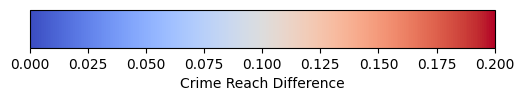

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Create a figure and axis
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

# Define a colormap
cmap = plt.get_cmap('coolwarm')

# Create a normalizer that scales data from 0 to 0.2
norm = mcolors.Normalize(vmin=0, vmax=0.2)

# Create a colorbar
cb = fig.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    cax=ax,
    orientation='horizontal'
)

# Set the colorbar label
cb.set_label('Crime Reach Difference')

# Save the colorbar as an image file
plt.savefig('color_scale_0_to_0.2.png')

# Display the colorbar
plt.show()

In [33]:
future_dataset.head()

,id,type,Year,street_count,longitude,latitude,elevation,average_segments_length,betweenness_centrality,scaled_betweenness_centrality,...,unemployment_rate,public_transport,median_household_income,population_in_low_income_households,baseline_outcome,crime_reach,crime_reach_2023,crime_reach_difference,normalized_crime_reach,normalized_diff
0,1,Junction,2024,2,-123.224758,49.274760,65,396.227813,0.000000e+00,0.000000,...,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,5.817873e-15
1,4,Junction,2024,4,-123.220892,49.271168,90,480.393636,2.100000e-07,0.020964,...,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,5.817873e-15
2,5,Junction,2024,3,-123.220567,49.273832,71,522.393980,3.214230e-04,32.142337,...,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,5.817873e-15
3,6,Junction,2024,3,-123.219613,49.268957,93,265.464150,3.203230e-04,32.032279,...,7.31,33.69,80873.5,20.29,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,5.817873e-15
4,7,Junction,2024,2,-123.219572,49.267203,97,261.840633,4.610000e-06,0.461198,...,7.31,33.69,80873.5,20.29,3.082790e-13,3.082790e-13,3.082790e-13,0.0,3.082790e-13,5.817873e-15


In [28]:
m

In [29]:
m_diff